In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#**Resnet Model**

In [ ]:
'''import splitfolders

splitfolders.ratio("/content/drive/MyDrive/GP Dataset", # The location of dataset
                   output="/content/drive/MyDrive/GP Dataset", # The output location
                   seed=42, # The number of seed
                   ratio=(.7, .2, .1), # The ratio of splited dataset
                   group_prefix=None, # If your dataset contains more than one file like ".jpg", ".pdf", etc
                   move=False # If you choose to move, turn this into True
                   )'''

'import splitfolders\n\nsplitfolders.ratio("/content/drive/MyDrive/GP Dataset", # The location of dataset\n                   output="/content/drive/MyDrive/GP Dataset", # The output location\n                   seed=42, # The number of seed\n                   ratio=(.7, .2, .1), # The ratio of splited dataset\n                   group_prefix=None, # If your dataset contains more than one file like ".jpg", ".pdf", etc\n                   move=False # If you choose to move, turn this into True\n                   )'

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

import copy
from collections import namedtuple
import os
import random
import shutil
import time

SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [ ]:
RESNET_Model_TRAIN_RATIO = 0.8

RESNET_Model_TrainDirctory = os.path.join('/content/drive/MyDrive/GP Dataset', 'train')
RESNET_Model_TestDirectory = os.path.join('/content/drive/MyDrive/GP Dataset', 'test')

RESNET_Model_TrainDataset = datasets.ImageFolder(root=RESNET_Model_TrainDirctory,
                                                 transform=transforms.ToTensor())

In [ ]:
calculateModelMeans = torch.zeros(3)
calculateModelStds = torch.zeros(3)

for RESNET_Model_TrainImage, RESNET_Model_TrainLabel in RESNET_Model_TrainDataset:
    calculateModelMeans += torch.mean(RESNET_Model_TrainImage, dim=(1, 2))
    calculateModelStds += torch.std(RESNET_Model_TrainImage, dim=(1, 2))

calculateModelMeans /= len(RESNET_Model_TrainDataset)
calculateModelStds /= len(RESNET_Model_TrainDataset)

print(f'Calculated Model Means: {calculateModelMeans}')
print(f'Calculated Model Stds: {calculateModelStds}')

Calculated Model Means: tensor([0.1781, 0.1834, 0.1893])
Calculated Model Stds: tensor([0.3477, 0.3553, 0.3590])


In [ ]:
RESNET_Model_pretrainedSize = 224 # image size
RESNET_Model_pretrainedMeans = [0.485, 0.456, 0.406] # opt values
RESNET_Model_pretrainedStds = [0.229, 0.224, 0.225] # opt values

RESNET_Model_trainTransforms = transforms.Compose([
    transforms.Resize(RESNET_Model_pretrainedSize),
    transforms.RandomRotation(5),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomCrop(RESNET_Model_pretrainedSize, padding=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=RESNET_Model_pretrainedMeans,
                         std=RESNET_Model_pretrainedStds)
])

RESNET_Model_testTransforms = transforms.Compose([
    transforms.Resize(RESNET_Model_pretrainedSize),
    transforms.CenterCrop(RESNET_Model_pretrainedSize),
    transforms.ToTensor(),
    transforms.Normalize(mean=RESNET_Model_pretrainedMeans,
                         std=RESNET_Model_pretrainedStds)
])

RESNET_Model_TrainDataset = datasets.ImageFolder(root=RESNET_Model_TrainDirctory,
                                                 transform=RESNET_Model_trainTransforms)

RESNET_Model_TestDataset = datasets.ImageFolder(root=RESNET_Model_TestDirectory,
                                                transform=RESNET_Model_testTransforms)


In [ ]:
RESNET_Model_VALID_RATIO = 0.9

RESNET_Model_numberTrainExamples = int(len(RESNET_Model_TrainDataset) * RESNET_Model_VALID_RATIO)
RESNET_Model_numberValidExamples = len(RESNET_Model_TrainDataset) - RESNET_Model_numberTrainExamples

RESNET_Model_TrainDataset, RESNET_Model_ValidDataset = data.random_split(RESNET_Model_TrainDataset,
                                                                         [RESNET_Model_numberTrainExamples, RESNET_Model_numberValidExamples])


In [ ]:
RESNET_Model_ValidDataset = copy.deepcopy(RESNET_Model_ValidDataset)
RESNET_Model_ValidDataset.dataset.transform = RESNET_Model_testTransforms

In [ ]:
print(f'Number of Training Examples: {len(RESNET_Model_TrainDataset)}')
print(f'Number of Validation Examples: {len(RESNET_Model_ValidDataset)}')
print(f'Number of Testing Examples: {len(RESNET_Model_TestDataset)}')

Number of Training Examples: 360
Number of Validation Examples: 40
Number of Testing Examples: 400


In [ ]:
# update weight after 64 iterations
RESNET_Model_BATCH_SIZE = 64

RESNET_Model_DataloaderTrainning = data.DataLoader(RESNET_Model_TrainDataset,
                                                   shuffle=True,
                                                   batch_size=RESNET_Model_BATCH_SIZE)

RESNET_Model_DataloaderValiding = data.DataLoader(RESNET_Model_ValidDataset,
                                                  batch_size=RESNET_Model_BATCH_SIZE)

RESNET_Model_DataloaderTesting = data.DataLoader(RESNET_Model_TestDataset,
                                                 batch_size=RESNET_Model_BATCH_SIZE)


In [ ]:
# normalize image to make it in center
def GettingNormalizedImage(input_image):
    calculateImageMin = input_image.min()
    calculateImageMax = input_image.max()
    input_image.clamp_(min=calculateImageMin, max=calculateImageMax)
    input_image.add_(-calculateImageMin).div_(calculateImageMax - calculateImageMin + 1e-5)

    return input_image


def GettingPlotImages(inputImages, inputImagesLabels, inputImagesClasses, ImagesNormalize=True):
    numberOfImages = len(inputImages)

    numberOfImageRows = int(np.sqrt(numberOfImages))
    numberOfImageCols = int(np.sqrt(numberOfImages))

    createImageFigure = plt.figure(figsize=(15, 15))

    for i in range(numberOfImageRows * numberOfImageCols):

        ax = createImageFigure.add_subplot(numberOfImageRows, numberOfImageCols, i + 1)

        displayImage = inputImages[i]

        if ImagesNormalize:
            displayImage = GettingNormalizedImage(displayImage)

        ax.imshow(displayImage.permute(1, 2, 0).cpu().numpy())
        displayImagelabel = inputImagesClasses[inputImagesLabels[i]]
        ax.set_title(displayImagelabel)
        ax.axis('off')

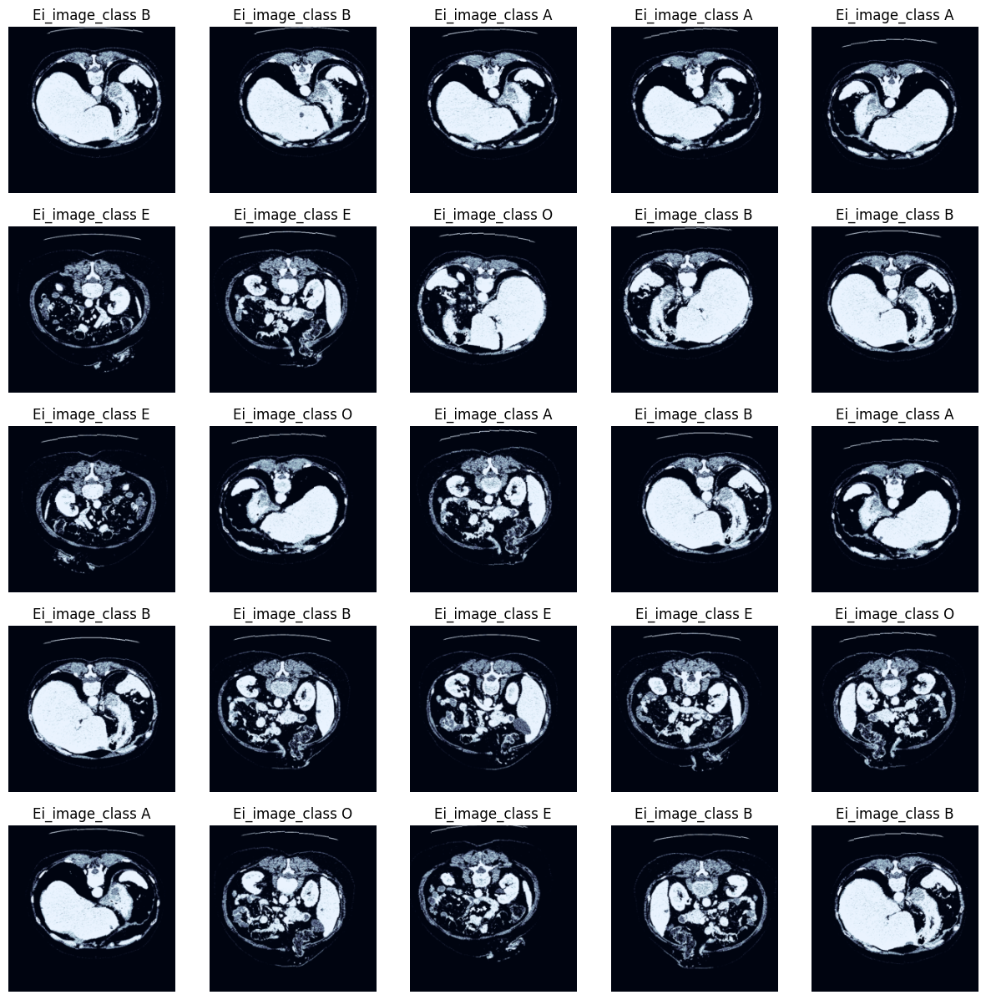

In [ ]:
displayNumberOfImages = 25

displayImages, displayLabels = zip(*[(RESNET_Model_Train_Image, RESNET_Model_Train_label) for RESNET_Model_Train_Image, RESNET_Model_Train_label in
                                     [RESNET_Model_TrainDataset[i] for i in range(displayNumberOfImages)]])

classes = RESNET_Model_TestDataset.classes

GettingPlotImages(displayImages, displayLabels, classes)

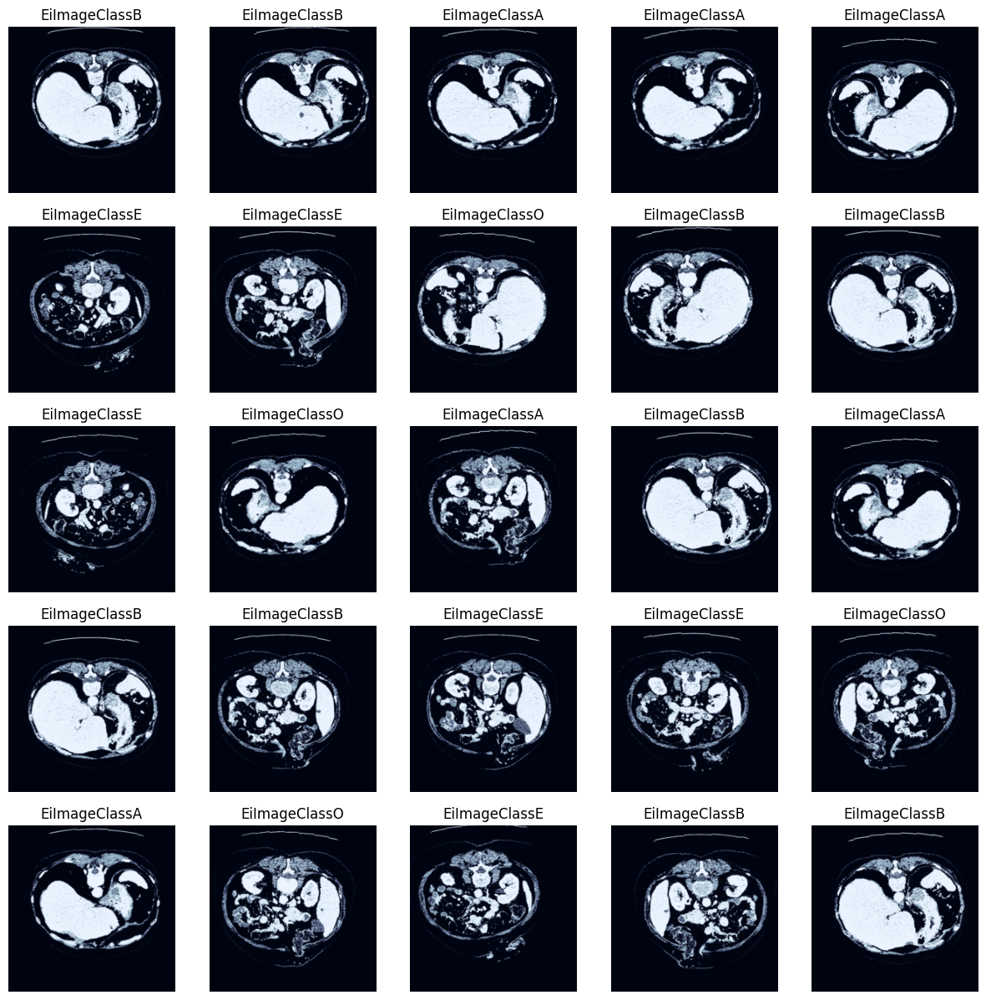

In [ ]:
def CalculatingFormatLabel(inputImageLabel):
    inputImageLabel = inputImageLabel.split('.')[-1]
    inputImageLabel = inputImageLabel.replace('_', ' ')
    inputImageLabel = inputImageLabel.title()
    inputImageLabel = inputImageLabel.replace(' ', '')
    return inputImageLabel


RESNET_Model_TestDataset.classes = [CalculatingFormatLabel(c) for c in RESNET_Model_TestDataset.classes]

classes = RESNET_Model_TestDataset.classes

GettingPlotImages(displayImages, displayLabels, classes)

In [ ]:
class ResNetModelClass(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()

        block, n_blocks, channels = config
        self.in_channels = channels[0]

        assert len(n_blocks) == len(channels) == 4

        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride=2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride=2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(self.in_channels, output_dim)

    def get_resnet_layer(self, block, n_blocks, channels, stride=1):

        layers = []

        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False

        layers.append(block(self.in_channels, channels, stride, downsample))

        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels

        return nn.Sequential(*layers)

    def forward(self, input_x):
        input_x = self.conv1(input_x)
        input_x = self.bn1(input_x)
        input_x = self.relu(input_x)
        input_x = self.maxpool(input_x)

        input_x = self.layer1(input_x)
        input_x = self.layer2(input_x)
        input_x = self.layer3(input_x)
        input_x = self.layer4(input_x)

        input_x = self.avgpool(input_x)
        calculate_h = input_x.view(input_x.shape[0], -1)
        input_x = self.fc(calculate_h)

        return input_x, calculate_h

In [ ]:
class BasicBlockClass(nn.Module):
    expansion = 1

    def __init__(self, in_channels, out_channels, stride=1, downsample=False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace=True)

        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size=1,
                             stride=stride, bias=False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None

        self.downsample = downsample

    def forward(self, input_x):

        input_x_temp = input_x

        input_x = self.conv1(input_x)
        input_x = self.bn1(input_x)
        input_x = self.relu(input_x)

        input_x = self.conv2(input_x)
        input_x = self.bn2(input_x)

        if self.downsample is not None:
            input_x_temp = self.downsample(input_x_temp)

        input_x += input_x_temp
        input_x = self.relu(input_x)

        return input_x

In [ ]:
ResNet_Model_Config = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])

RESNET_18_config = ResNet_Model_Config(block=BasicBlockClass,
                                       n_blocks=[2, 2, 2, 2],
                                       channels=[64, 128, 256, 512])

RESNET_34_config = ResNet_Model_Config(block=BasicBlockClass,
                                       n_blocks=[3, 4, 6, 3],
                                       channels=[64, 128, 256, 512])

In [ ]:
class BottleneckClass(nn.Module):
    expansion = 4

    def __init__(self, in_channels, out_channels, stride=1, downsample=False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1,
                               stride=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size=1,
                               stride=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)

        self.relu = nn.ReLU(inplace=True)

        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size=1,
                             stride=stride, bias=False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None

        self.downsample = downsample

    def forward(self, input_x):

        input_x_temp = input_x

        input_x = self.conv1(input_x)
        input_x = self.bn1(input_x)
        input_x = self.relu(input_x)

        input_x = self.conv2(input_x)
        input_x = self.bn2(input_x)
        input_x = self.relu(input_x)

        input_x = self.conv3(input_x)
        input_x = self.bn3(input_x)

        if self.downsample is not None:
            input_x_temp = self.downsample(input_x_temp)

        input_x += input_x_temp
        input_x = self.relu(input_x)

        return input_x

In [ ]:
RESNET_50_config = ResNet_Model_Config(block=BottleneckClass,
                                       n_blocks=[3, 4, 6, 3],
                                       channels=[64, 128, 256, 512])

RESNET_101_config = ResNet_Model_Config(block=BottleneckClass,
                                        n_blocks=[3, 4, 23, 3],
                                        channels=[64, 128, 256, 512])

RESNET_152_config = ResNet_Model_Config(block=BottleneckClass,
                                        n_blocks=[3, 8, 36, 3],
                                        channels=[64, 128, 256, 512])


In [ ]:
class DataResNetClass(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()

        block, layers, channels = config
        self.in_channels = channels[0]

        assert len(layers) == len(channels) == 3
        assert all([i == j * 2 for i, j in zip(channels[1:], channels[:-1])])

        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace=True)

        self.layer1 = self.get_resnet_layer(block, layers[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, layers[1], channels[1], stride=2)
        self.layer3 = self.get_resnet_layer(block, layers[2], channels[2], stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(self.in_channels, output_dim)

    def get_resnet_layer(self, block, n_blocks, channels, stride=1):

        create_layers = []

        if self.in_channels != channels:
            downsample = True
        else:
            downsample = False

        create_layers.append(block(self.in_channels, channels, stride, downsample))

        for i in range(1, n_blocks):
            create_layers.append(block(channels, channels))

        self.in_channels = channels

        return nn.Sequential(*create_layers)

    def forward(self, input_x):
        input_x = self.conv1(input_x)
        input_x = self.bn1(input_x)
        input_x = self.relu(input_x)

        input_x = self.layer1(input_x)
        input_x = self.layer2(input_x)
        input_x = self.layer3(input_x)

        input_x = self.avgpool(input_x)
        calculate_h = input_x.view(input_x.shape[0], -1)
        input_x = self.fc(calculate_h)

        return input_x, calculate_h

In [ ]:
class DataBasicBlockClass(nn.Module):

    def __init__(self, in_channels, out_channels, stride=1, downsample=False):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace=True)

        if downsample:
            identity_fn = lambda x: F.pad(x[:, :, ::2, ::2],
                                          [0, 0, 0, 0, in_channels // 2, in_channels // 2])
            downsample = Identity(identity_fn)
        else:
            downsample = None

        self.downsample = downsample

    def forward(self, input_x):

        input_x_temp = input_x

        input_x = self.conv1(input_x)
        input_x = self.bn1(input_x)
        input_x = self.relu(input_x)

        input_x = self.conv2(input_x)
        input_x = self.bn2(input_x)

        if self.downsample is not None:
            input_x_temp = self.downsample(input_x_temp)

        input_x += input_x_temp
        input_x = self.relu(input_x)

        return input_x

In [ ]:
DataRESNET_20_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                           n_blocks=[3, 3, 3],
                                           channels=[16, 32, 64])

DataRESNET_32_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                           n_blocks=[5, 5, 5],
                                           channels=[16, 32, 64])

DataRESNET_44_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                           n_blocks=[7, 7, 7],
                                           channels=[16, 32, 64])

DataRESNET_56_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                           n_blocks=[9, 9, 9],
                                           channels=[16, 32, 64])

DataRESNET_110_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                            n_blocks=[18, 18, 18],
                                            channels=[16, 32, 64])

DataRESNET_1202_config = ResNet_Model_Config(block=DataBasicBlockClass,
                                             n_blocks=[20, 20, 20],
                                             channels=[16, 32, 64])

In [ ]:
RESNETPretrainedModel = models.resnet50(pretrained=True)

print(RESNETPretrainedModel)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 176MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
RESNET_INPUT_FEATURES = RESNETPretrainedModel.fc.in_features
RESNET_OUTPUT_DIM = len(RESNET_Model_TestDataset.classes)

fc = nn.Linear(RESNET_INPUT_FEATURES, RESNET_OUTPUT_DIM)

RESNETPretrainedModel.fc = fc

model = ResNetModelClass(RESNET_50_config, RESNET_OUTPUT_DIM)

model.load_state_dict(RESNETPretrainedModel.state_dict())

<All keys matched successfully>

In [ ]:
def GettingNumberOfParameters(RESNET_Model):
    return sum(p.numel() for p in RESNET_Model.parameters() if p.requires_grad)

print(f'The Model Has {GettingNumberOfParameters(model):,} Trainable Parameters')

The Model Has 23,516,228 Trainable Parameters


In [ ]:
RESNET_START_LR = 1e-7

optimizer = optim.Adam(model.parameters(), lr=RESNET_START_LR)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

In [ ]:
class LRFinderClass:
    def __init__(self, model, optimizer, criterion, device):

        self.optimizer = optimizer
        self.model = model
        self.criterion = criterion
        self.device = device

        torch.save(model.state_dict(), 'initial_parameters_file.pt')

    def range_test(self, calculate_iterator, end_lr=10, num_iter=100,
                   smooth_f=0.05, diverge_th=5):

        createLRS = []
        createLosses = []
        createBestLoss = float('inf')

        calculate_lr_scheduler = ExponentialLRClass(self.optimizer, end_lr, num_iter)

        calculate_iterator = IteratorWrapper(calculate_iterator)

        for iteration in range(num_iter):
            print('iteration = ', iteration)
            loss = self._train_batch(calculate_iterator)

            # update lr
            calculate_lr_scheduler.step()

            createLRS.append(calculate_lr_scheduler.get_lr()[0])

            if iteration > 0:
                loss = smooth_f * loss + (1 - smooth_f) * createLosses[-1]

            if loss < createBestLoss:
                createBestLoss = loss

            createLosses.append(loss)

            if loss > diverge_th * createBestLoss:
                print("Stopping Early, The Loss Has Diverged")
                break

        # reset model to initial parameters
        model.load_state_dict(torch.load('initial_parameters_file.pt'))

        return createLRS, createLosses

    def _train_batch(self, iterator):

        self.model.train()

        self.optimizer.zero_grad()

        get_x, get_y = iterator.get_batch()

        get_x = get_x.to(self.device)
        get_y = get_y.to(self.device)

        get_y_pred, _ = self.model(get_x)

        get_loss = self.criterion(get_y_pred, get_y)

        get_loss.backward()

        self.optimizer.step()

        return get_loss.item()


class ExponentialLRClass(_LRScheduler):
    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr
        self.num_iter = num_iter
        super(ExponentialLRClass, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        calculate_curruntIteration = self.last_epoch + 1
        calculate_r = calculate_curruntIteration / self.num_iter
        return [base_lr * (self.end_lr / base_lr) ** calculate_r for base_lr in self.base_lrs]


class IteratorWrapper:
    def __init__(self, iterator):
        self.iterator = iterator
        self._iterator = iter(iterator)

    def __next__(self):
        try:
            get_inputs, get_labels = next(self._iterator)
        except StopIteration:
            self._iterator = iter(self.iterator)
            get_inputs, get_labels, *_ = next(self._iterator)

        return get_inputs, get_labels

    def get_batch(self):
        return next(self)


RESNET_END_LR = 10
RESNET_NUM_ITER = 5 #100

lr_finderObject = LRFinderClass(model, optimizer, criterion, device)
finderObject_lrs, finderObject_losses = lr_finderObject.range_test(RESNET_Model_DataloaderTrainning, RESNET_END_LR, RESNET_NUM_ITER)

iteration =  0
iteration =  1
iteration =  2
iteration =  3
iteration =  4


In [ ]:
def GettingPlotLRFinder(lrs, losses, skip_start=5, skip_end=5):
    if skip_end == 0:
        lrs = lrs[skip_start:]
        losses = losses[skip_start:]
    else:
        lrs = lrs[skip_start:-skip_end]
        losses = losses[skip_start:-skip_end]

    fig = plt.figure(figsize=(16, 8))
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(lrs, losses)
    ax.set_xscale('log')
    ax.set_xlabel('Learning rate')
    ax.set_ylabel('Loss')
    ax.grid(True, 'both', 'x')
    plt.show()


#GettingPlotLRFinder(finderObject_lrs, finderObject_losses, skip_start=30, skip_end=30)


In [ ]:
RESNET_FOUND_LR = 1e-3

params = [
    {'params': model.conv1.parameters(), 'lr': RESNET_FOUND_LR / 10},
    {'params': model.bn1.parameters(), 'lr': RESNET_FOUND_LR / 10},
    {'params': model.layer1.parameters(), 'lr': RESNET_FOUND_LR / 8},
    {'params': model.layer2.parameters(), 'lr': RESNET_FOUND_LR / 6},
    {'params': model.layer3.parameters(), 'lr': RESNET_FOUND_LR / 4},
    {'params': model.layer4.parameters(), 'lr': RESNET_FOUND_LR / 2},
    {'params': model.fc.parameters()}
]

optimizer = optim.Adam(params, lr=RESNET_FOUND_LR)

In [ ]:
EPOCHS = 2
RESNET_STEPS_PER_EPOCH = len(RESNET_Model_DataloaderTrainning)
RESNET_TOTAL_STEPS = EPOCHS * RESNET_STEPS_PER_EPOCH

RESNET_MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr=RESNET_MAX_LRS,
                                    total_steps=RESNET_TOTAL_STEPS)


In [ ]:
def Calculating_topkAccuracy(input_y_pred, input_y, input_numberOfK=3):

    with torch.no_grad():
        calculate_batch_size = input_y.shape[0]
        _, calculate_top_pred = input_y_pred.topk(input_numberOfK, 1)
        calculate_top_pred = calculate_top_pred.t()
        calculate_correct = calculate_top_pred.eq(input_y.view(1, -1).expand_as(calculate_top_pred))
        calculate_correct_1 = calculate_correct[:1].reshape(-1).float().sum(0, keepdim=True)
        calculate_correct_k = calculate_correct[:input_numberOfK].reshape(-1).float().sum(0, keepdim=True)
        calculate_acc_1 = calculate_correct_1 / calculate_batch_size
        calculate_acc_k = calculate_correct_k / calculate_batch_size

    return calculate_acc_1, calculate_acc_k

In [ ]:
def train(input_model, input_iterator, input_optimizer, input_criterion, input_scheduler, input_device):
    create_epochLoss = 0
    create_epochAcc_1 = 0
    create_epochAcc_5 = 0

    input_model.train()

    for (input_iter_x, input_iter_y) in input_iterator:
        input_iter_x = input_iter_x.to(input_device)
        input_iter_y = input_iter_y.to(input_device)

        input_optimizer.zero_grad()

        calculate_y_pred, _ = input_model(input_iter_x)

        calculate_loss = input_criterion(calculate_y_pred, input_iter_y)

        calculate_acc_1, calculate_acc_5 = Calculating_topkAccuracy(calculate_y_pred, input_iter_y)

        calculate_loss.backward()

        input_optimizer.step()

        input_scheduler.step()

        create_epochLoss += calculate_loss.item()
        create_epochAcc_1 += calculate_acc_1.item()
        create_epochAcc_5 += calculate_acc_5.item()

    create_epochLoss /= len(input_iterator)
    create_epochAcc_1 /= len(input_iterator)
    create_epochAcc_5 /= len(input_iterator)

    return create_epochLoss, create_epochAcc_1, create_epochAcc_5

In [ ]:
def evaluate(input_model, input_iterator, input_criterion, input_device):
    create_epochLoss = 0
    create_epochAcc_1 = 0
    create_epochAcc_5 = 0

    input_model.eval()

    with torch.no_grad():

        for (input_iter_x, input_iter_y) in input_iterator:
            input_iter_x = input_iter_x.to(input_device)
            input_iter_y = input_iter_y.to(input_device)

            calculate_y_pred, _ = input_model(input_iter_x)

            calculate_loss = input_criterion(calculate_y_pred, input_iter_y)

            calculate_acc_1, calculate_acc_5 = Calculating_topkAccuracy(calculate_y_pred, input_iter_y)

            create_epochLoss += calculate_loss.item()
            create_epochAcc_1 += calculate_acc_1.item()
            create_epochAcc_5 += calculate_acc_5.item()

    create_epochLoss /= len(input_iterator)
    create_epochAcc_1 /= len(input_iterator)
    create_epochAcc_5 /= len(input_iterator)

    return create_epochLoss, create_epochAcc_1, create_epochAcc_5


def epoch_time(input_startTime, input_endTime):
    calculate_elapsedTime = input_endTime - input_startTime
    calculate_elapsedMins = int(calculate_elapsedTime / 60)
    calculate_elapsedSecs = int(calculate_elapsedTime - (calculate_elapsedMins * 60))
    return calculate_elapsedMins, calculate_elapsedSecs


In [ ]:
createBestValidLoss = float('inf')

for numberOfEpoch in range(EPOCHS):

    calculate_startTime = time.monotonic()

    calculate_train_loss, calculate_train_acc_1, calculate_train_acc_5 = train(model, RESNET_Model_DataloaderTrainning, optimizer, criterion, scheduler, device)
    calculate_valid_loss, calculate_valid_acc_1, calculate_valid_acc_5 = evaluate(model, RESNET_Model_DataloaderValiding, criterion, device)

    if calculate_valid_loss < createBestValidLoss:
        createBestValidLoss = calculate_valid_loss
        torch.save(model.state_dict(), 'RESNET_Model_file.pt')

    calculate_endTime = time.monotonic()

    calculate_epochMins, calculate_epochSecs = epoch_time(calculate_startTime, calculate_endTime)

    print(f'Epoch: {numberOfEpoch + 1:02} | Epoch Time: {calculate_epochMins}m {calculate_epochSecs}s')
    print(f'\tTrain Loss: {calculate_train_loss:.3f} | Train Acc: {calculate_train_acc_1 * 100:6.2f}% | ' \
          f'Train Acc: {calculate_train_acc_5 * 100:6.2f}%')
    print(f'\tValid Loss: {calculate_valid_loss:.3f} | Valid Acc: {calculate_valid_acc_1 * 100:6.2f}% | ' \
          f'Valid Acc: {calculate_valid_acc_5 * 100:6.2f}%')

Epoch: 01 | Epoch Time: 3m 13s
	Train Loss: 0.992 | Train Acc:  58.07% | Train Acc:  92.71%
	Valid Loss: 0.380 | Valid Acc:  85.00% | Valid Acc: 100.00%
Epoch: 02 | Epoch Time: 3m 12s
	Train Loss: 0.465 | Train Acc:  82.97% | Train Acc:  99.22%
	Valid Loss: 0.275 | Valid Acc:  87.50% | Valid Acc: 100.00%


In [ ]:
model.load_state_dict(torch.load('RESNET_Model_file.pt'))

calculate_testLoss, calculate_testAcc_1, calculate_testAcc_5 = evaluate(model, RESNET_Model_DataloaderTesting, criterion, device)

print(f'Test Loss: {calculate_testLoss:.3f} | Test Acc: {calculate_testAcc_1 * 100:6.2f}% | ' \
      f'Test Acc: {calculate_testAcc_5 * 100:6.2f}%')

Test Loss: 0.821 | Test Acc:  70.31% | Test Acc:  98.66%


In [ ]:
######### Examining the Model #########
def GettingPredictions(input_model, input_dataLoader):
    input_model.eval()

    createDataImages = []
    createDataLabels = []
    createDataProbs = []

    with torch.no_grad():
      #input_dataLoader_x == image, input_dataLoader_y == label
        for (input_dataLoader_x, input_dataLoader_y) in input_dataLoader:
            input_dataLoader_x = input_dataLoader_x.to(device)

            calculate_y_pred, _ = input_model(input_dataLoader_x)

            calculate_y_prob = F.softmax(calculate_y_pred, dim=-1)
            calculate_top_pred = calculate_y_prob.argmax(1, keepdim=True)

            createDataImages.append(input_dataLoader_x.cpu())
            createDataLabels.append(input_dataLoader_y.cpu())
            createDataProbs.append(calculate_y_prob.cpu())

    createDataImages = torch.cat(createDataImages, dim=0)
    createDataLabels = torch.cat(createDataLabels, dim=0)
    createDataProbs = torch.cat(createDataProbs, dim=0)

    return createDataImages, createDataLabels, createDataProbs


displayImages, displayLabels, displayProbs = GettingPredictions(model, RESNET_Model_DataloaderTesting)

pred_labels = torch.argmax(displayProbs, 1)

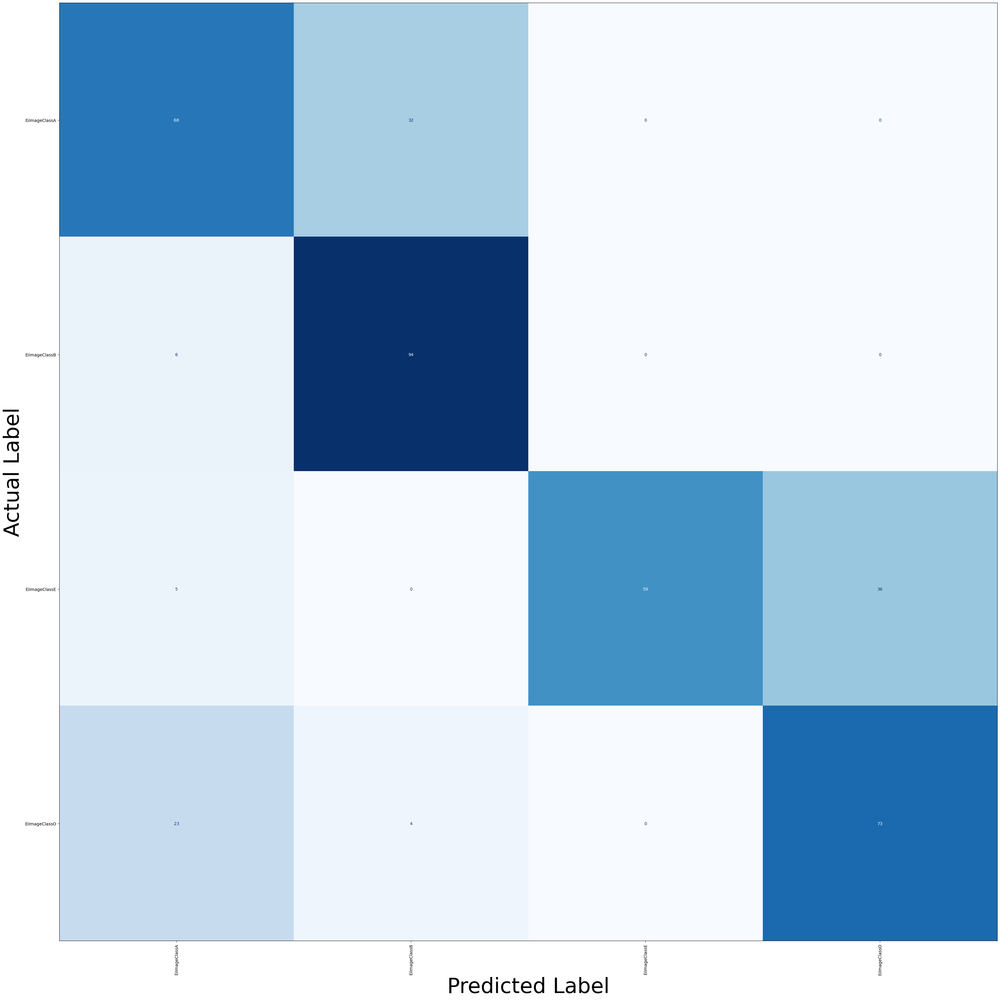

In [ ]:
def GettingPlotConfusionMatrix(input_labels, input_pred_labels, input_classes):
    createFigure = plt.figure(figsize=(50, 50))
    calculate_ax = createFigure.add_subplot(1, 1, 1)
    calculate_cm = confusion_matrix(input_labels, input_pred_labels)
    calculate_cm = ConfusionMatrixDisplay(calculate_cm, display_labels=input_classes)
    calculate_cm.plot(values_format='d', cmap='Blues', ax=calculate_ax)
    createFigure.delaxes(createFigure.axes[1])  # delete colorbar
    plt.xticks(rotation=90)
    plt.xlabel('Predicted Label', fontsize=50)
    plt.ylabel('Actual Label', fontsize=50)

GettingPlotConfusionMatrix(displayLabels, pred_labels, classes)

In [ ]:
calculate_corrects = torch.eq(displayLabels, pred_labels)
calculate_incorrectExamples = []
calculateTotalExamples = []

for imageIndex, labelIndex, probIndex, correctIndex in zip(displayImages, displayLabels, displayProbs, calculate_corrects):
    calculateTotalExamples.append((imageIndex, labelIndex, probIndex))

    if not correctIndex:
        calculate_incorrectExamples.append((imageIndex, labelIndex, probIndex))

calculate_incorrectExamples.sort(reverse=True, key=lambda x: torch.max(x[2], dim=0).values)
calculateTotalExamples.sort(reverse=True, key=lambda x: torch.max(x[2], dim=0).values)

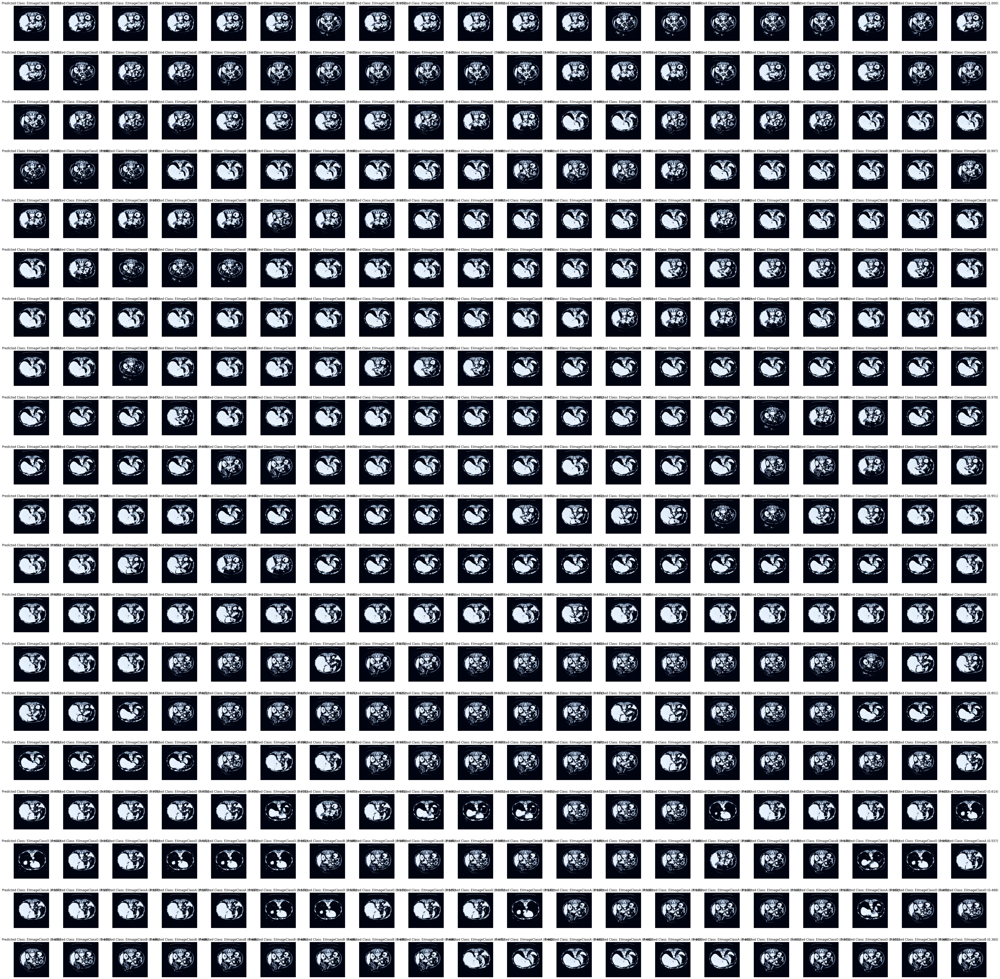

In [ ]:
### Display Total Examples With Prediction For Each Image ###

totalImagesRows = int(np.sqrt(len(calculateTotalExamples)))
totalImagesCols = int(np.sqrt(len(calculateTotalExamples)))
checkNormalizeTotalImages = True
predictedImagesLabels = []
createFigure = plt.figure(figsize=(70, 70))

for totalImagesCell in range(totalImagesRows * totalImagesCols):

    calculate_ax = createFigure.add_subplot(totalImagesRows, totalImagesCols, totalImagesCell + 1)

    totalImages_image, totalImages_trueLabel, totalImages_probs = calculateTotalExamples[totalImagesCell]
    totalImages_image = totalImages_image.permute(1, 2, 0)
    #calculate_trueProb = totalImages_probs[totalImages_trueLabel]
    calculate_incorrectProb, calculate_incorrectLabel = torch.max(totalImages_probs, dim=0)
    #calculate_trueClass = classes[totalImages_trueLabel]
    calculate_incorrectClass = classes[calculate_incorrectLabel]
    predictedImagesLabels.append(calculate_incorrectClass)

    if checkNormalizeTotalImages:
        totalImages_image = GettingNormalizedImage(totalImages_image)

    calculate_ax.imshow(totalImages_image.cpu().numpy())
    calculate_ax.set_title(f'Predicted Class: {calculate_incorrectClass} ({calculate_incorrectProb:.3f})')

    calculate_ax.axis('off')

createFigure.subplots_adjust(hspace=0.4)

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.contrib import lite

#model = keras.Sequential([keras.layers.Dense(units = 1, input_shape = [1])])
#model.compile(optimizer = 'sgd', loss = 'mean_squared_error')

keras_file = "model.h52"
keras.models.save_model(model, keras_file)

#converter = tf. lite. TFLiteConverter. from_saved_model(keras_file)
converter = lite.TocoConverter.from_keras_model_file(keras_file)
tflite_model = converter.convert()
open("model.tflite2", "wb").write(tflite_model)